In [80]:
import os
import tiffile
import numpy as np
import json
from PIL import Image, ImageDraw
import cv2
import shapely.wkt

import matplotlib.pyplot as plt

In [302]:
tif_pre_path = '../datasets/geotiffs/tier1/images/guatemala-volcano_00000000_pre_disaster.tif'
tif_post_path = '../datasets/geotiffs/tier1/images/guatemala-volcano_00000000_post_disaster.tif'
lbl_pre_path = '../datasets/geotiffs/tier1/labels/guatemala-volcano_00000000_pre_disaster.json'
lbl_post_path = '../datasets/geotiffs/tier1/labels/guatemala-volcano_00000000_post_disaster.json'

In [303]:
tif_pre = tiffile.imread(tif_pre_path)
tif_post = tiffile.imread(tif_post_path)

with open(lbl_pre_path, 'r') as infile:
    lbl_pre = json.load(infile)
    
with open(lbl_post_path, 'r') as infile:
    lbl_post = json.load(infile)

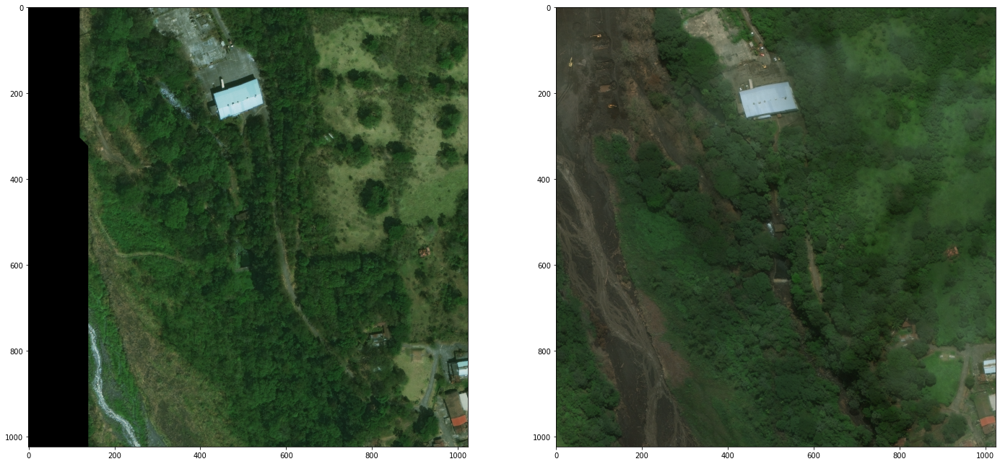

In [304]:
fig, ax = plt.subplots(1,2)
fig.set_size_inches(24,12)
fig.set_facecolor('w')

ax[0].imshow(tif_pre)
ax[1].imshow(tif_post)
plt.show()

In [6]:
pre_polys = []
for feat in lbl_pre['features']['xy']:
    poly = shapely.wkt.loads(feat['wkt'])
    pre_polys.append(poly)

In [16]:
img = Image.fromarray(np.uint8(tif_pre))
img2 = img.copy()
draw = ImageDraw.Draw(img2, 'RGBA')
for poly in pre_polys:
    draw.polygon(list(zip(poly.exterior.xy[0],poly.exterior.xy[1])), fill=(200,20,20,120),outline = "red")

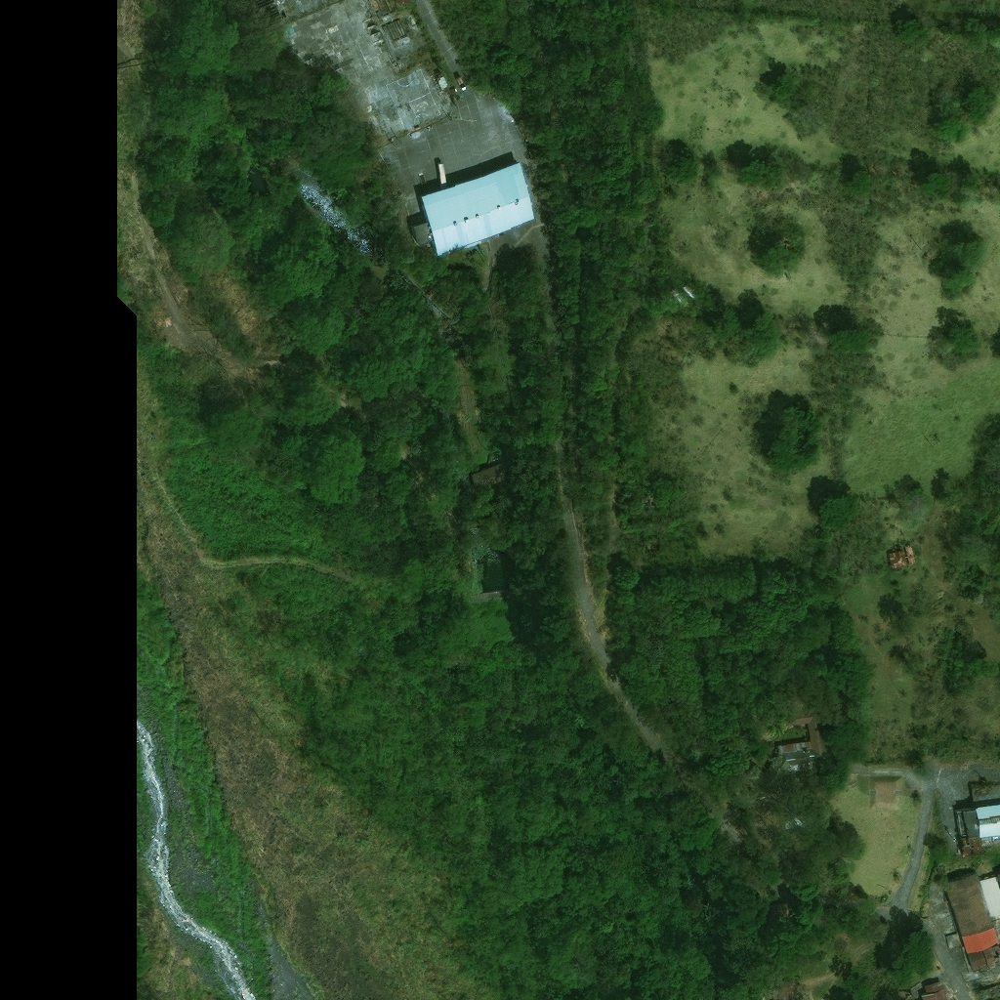

In [39]:
img

In [127]:
def draw_buildings(tif, lbl):
    """
    Function that takes an input tif and corresponding label in json format, which includes
    buildings as WKT Polygons and returns a PIL Image of the Polygons overlayed.
    
    Inputs:
    tif - NumPy array. Expected from tiffile.imread()
    lbl - JSON Label. Must contain `features`, `properties`, `feature_type`, `xy`, `wkt` keys.
    
    Outputs:
    img - PIL Image with Polygons drawn
    """
    #Color code based on damage level
    damage_level_dict = {'pre-disaster':(180,180,180,120),
                         'no-damage':(0, 200, 0, 120), 
                         'minor-damage':(250,250,0,120),
                         'major-damage':(250,100,20,120), 
                         'destroyed':(250,20,20,120),
                         'un-classified':(255,255,255,120)}
    
    #Convert tif to PIL Image (tif should be np array from tiffile.imread)
    img = Image.fromarray(np.uint8(tif)).copy()
    
    #Define ImageDraw to be able to overlay polygons
    draw = ImageDraw.Draw(img, 'RGBA') #Need alpha channel for some transparency

    #Loop over all features
    for feat in lbl['features']['xy']:
        #Check if feature is a building
        if feat['properties']['feature_type'] == 'building':
            #Polygon is given as a string, we use shapely to convert to Poly
            poly = shapely.wkt.loads(feat['wkt'])
            
            #`subtype` key only exists on post images, check if it is present, 
            #and obtain appropriate color for damage level 
            if 'subtype' in feat['properties'].keys():
                damage_color = damage_level_dict[feat['properties']['subtype']]
            else:
                #If no subtype key exists, image must be `pre` disaster, so damage is nonexistant
                damage_color = damage_level_dict['pre-disaster']
                
            #Extract x,y coords of polygon's outline
            #NOTE: this ignores potential holes in the polygon
            x,y = poly.exterior.xy
            draw.polygon(list(zip(x,y)), fill = damage_color, outline= "black")

    return img
    

In [22]:
lbl_pre['features']['xy'][0]['properties']['feature_type']

'building'

In [29]:
list(zip(poly.exterior.xy[:]))

[(array('d', [925.1958625119616, 910.4958625119616, 912.8625291786283, 929.4958625119616, 925.1958625119616]),),
 (array('d', [563.2548991674288, 565.1548991674288, 584.3882325007621, 581.7548991674288, 563.2548991674288]),)]

In [31]:
a,b = poly.exterior.xy

In [34]:
list(zip(a,b))

[(925.1958625119616, 563.2548991674288),
 (910.4958625119616, 565.1548991674288),
 (912.8625291786283, 584.3882325007621),
 (929.4958625119616, 581.7548991674288),
 (925.1958625119616, 563.2548991674288)]

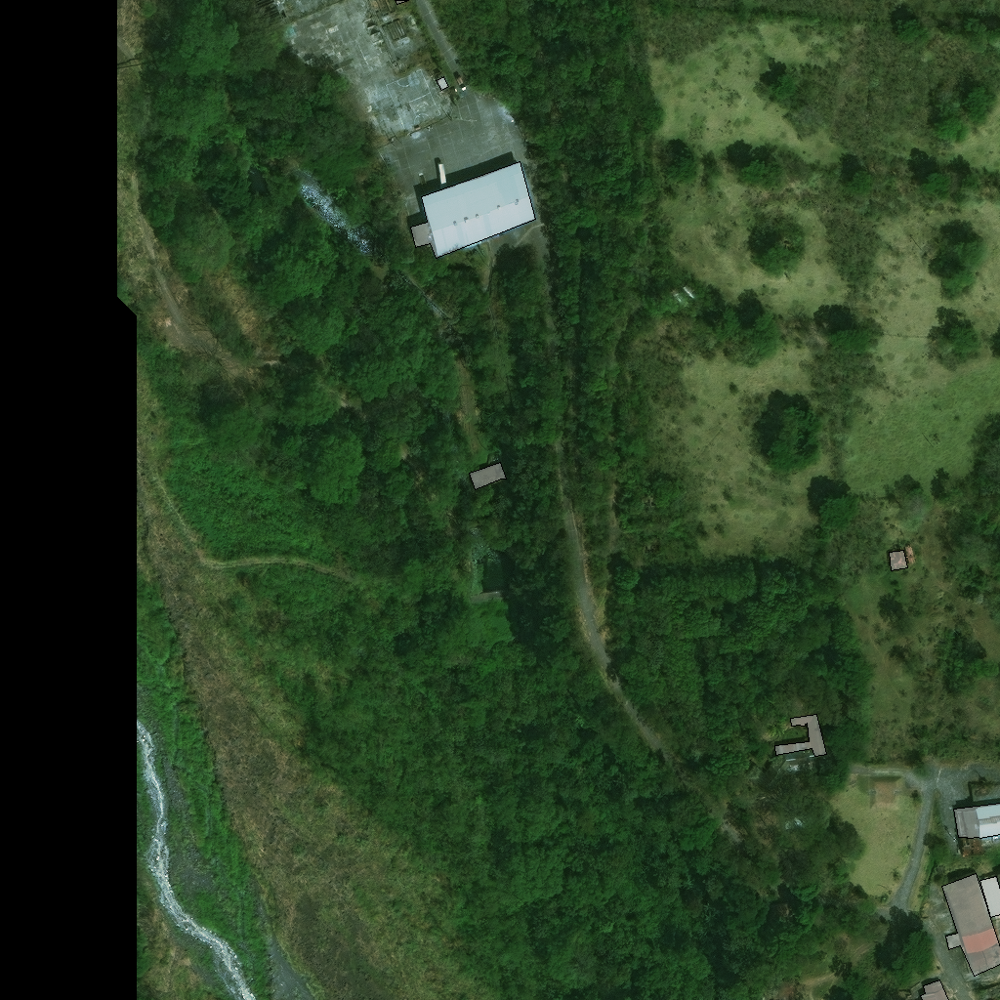

In [59]:
draw_buildings(tif_pre, lbl_pre)

In [149]:
TRAIN_PATHS = ['../datasets/geotiffs/tier1/images/','../datasets/geotiffs/tier3/images/']
LBLS_PATHS = ['../datasets/geotiffs/tier1/labels/','../datasets/geotiffs/tier3/labels/']

#Quantify damage per disaster
damage_dict = {}

# data_path = '../datasets/geotiffs/tier1/images/'
# lbls_path = '../datasets/geotiffs/tier1/labels/'
for data_path, lbls_path in zip(TRAIN_PATHS, LBLS_PATHS):
    #Use list comprehension to obtain a list of full image paths
    img_paths = [os.path.join(data_path,img_name ) for img_name in os.listdir(data_path)]

    #Loop over image paths and extract useful info from paths themselves
    for i, img_path in enumerate(img_paths):
        disaster, img_number, img_type = os.path.basename(img_path).split('_')[:3]

        if disaster not in damage_dict.keys():
            damage_dict[disaster] = {"num_images":0, 
                                     "num_buildings":0, 
                                     'no-damage':0,
                                     "minor-damage":0, 
                                     "major-damage":0,
                                     "destroyed":0, 
                                     "un-classified":0}


        #Construct the corresponding path to the label
        lbl_path = os.path.join(lbls_path, '%s_%s_%s_disaster.json' % (disaster, img_number, img_type))

        #Read image and label
        tif = tiffile.imread(img_path)
        with open(lbl_path, 'r') as infile:
            lbl = json.load(infile)

        if img_type == 'post':
            damage_dict[disaster]['num_images']+=1

            for feat in lbl['features']['xy']:
                #Check if feature is a building
                if feat['properties']['feature_type'] == 'building':
                        damage = feat['properties']['subtype']
                        damage_dict[disaster][damage]+=1
                        damage_dict[disaster]['num_buildings']+=1

        img = draw_buildings(tif, lbl)
        img.save('./figures/%s_%i.png' % (disaster, i))
        cv2.imshow('Tif', cv2.cvtColor(np.asarray(img), cv2.COLOR_RGB2BGR))
        cv2.waitKey(0)


        if i > 5:
            break
    cv2.destroyAllWindows()

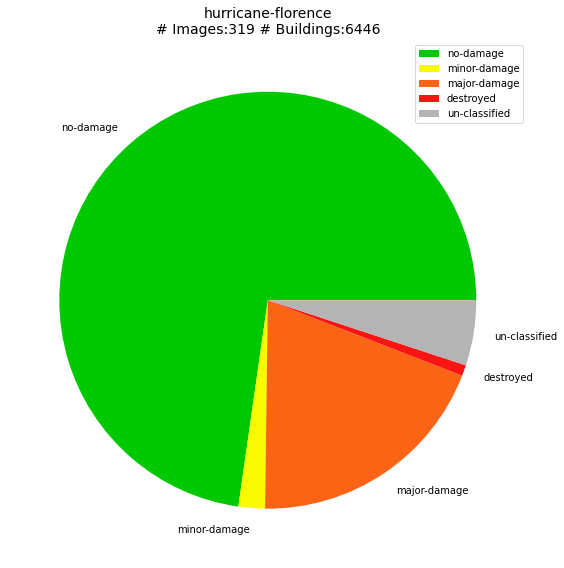

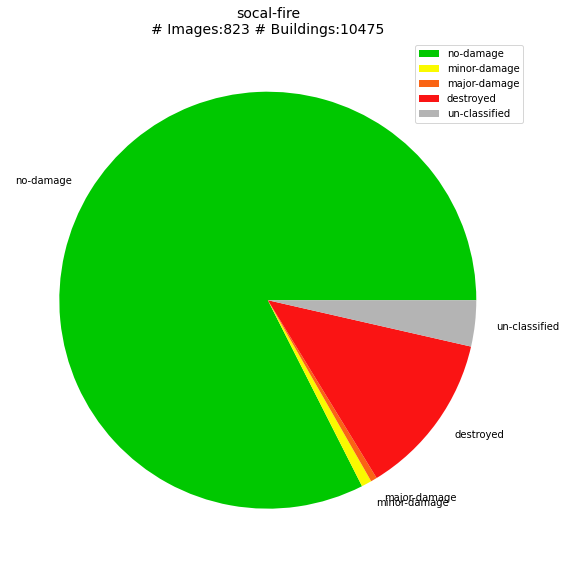

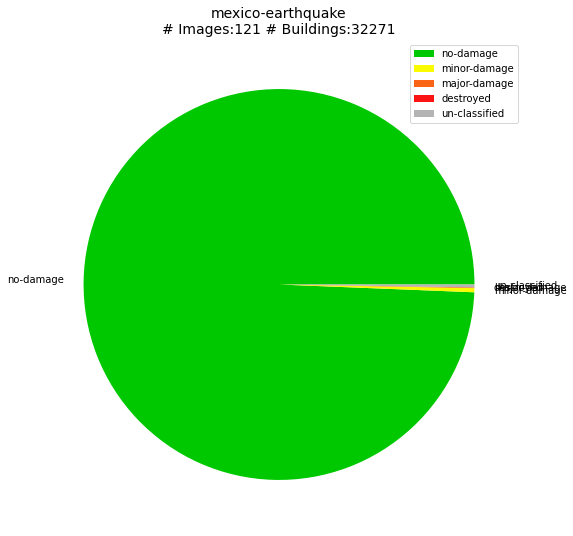

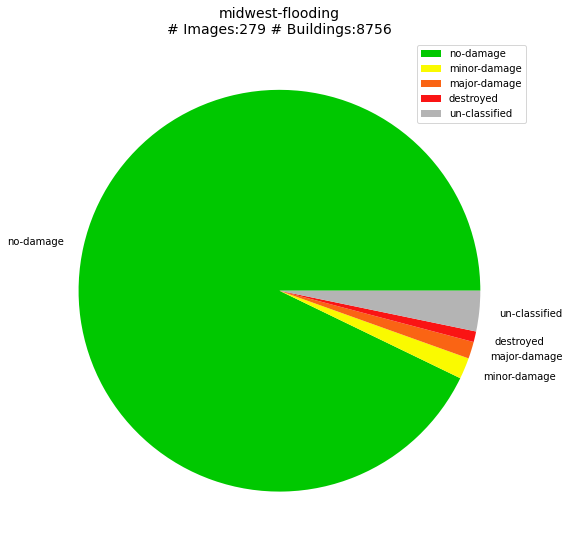

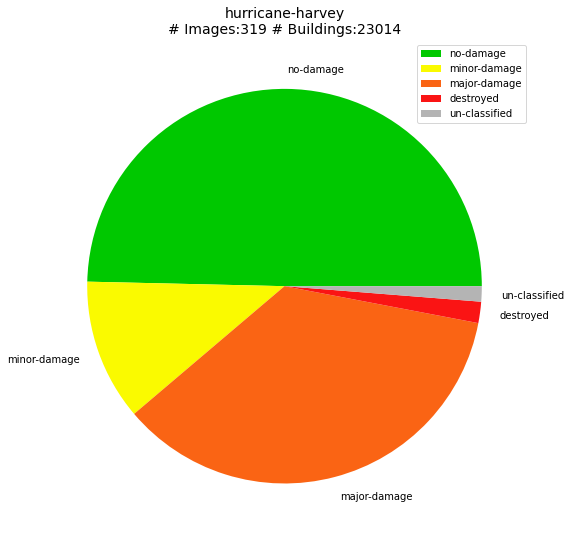

...

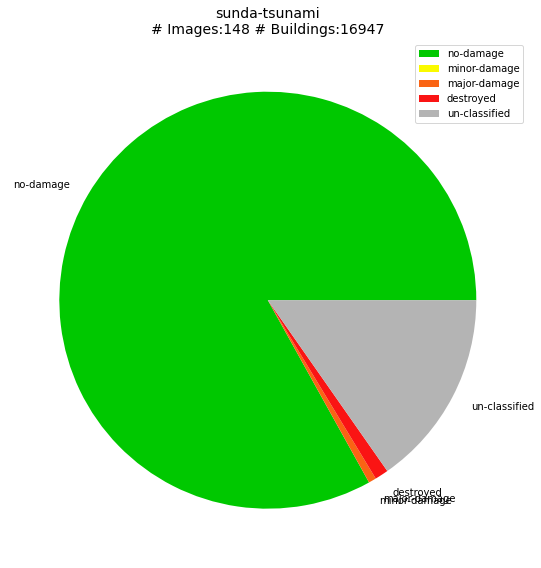

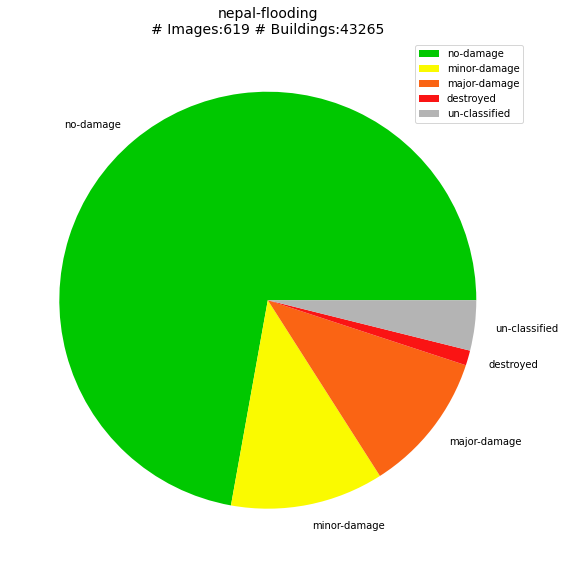

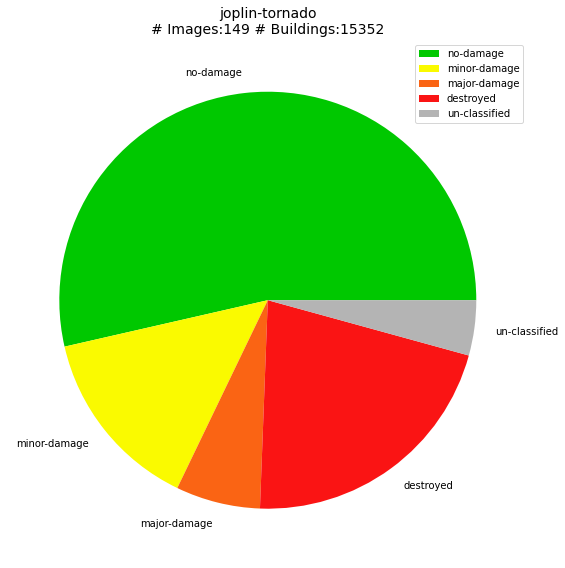

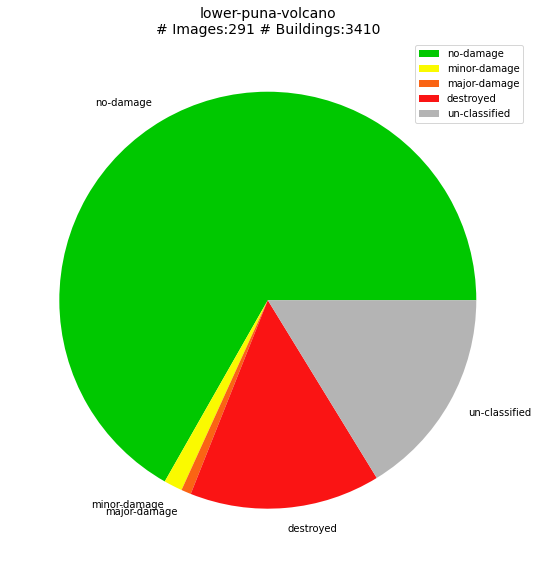

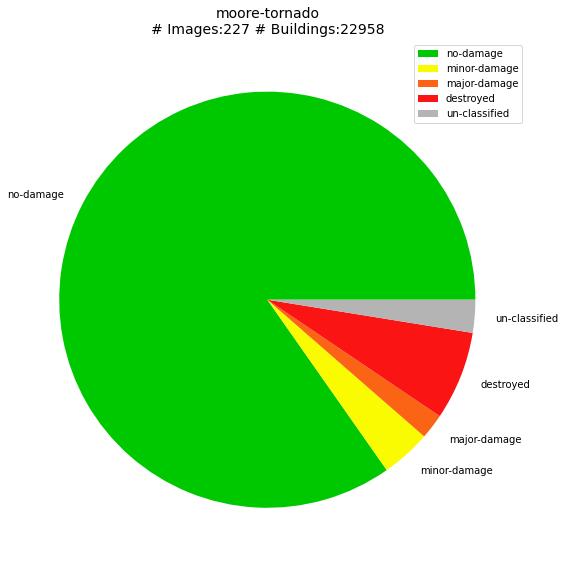

In [148]:
damage_level_dict = {'pre-disaster':(180,180,180),
                     'no-damage':(0, 200, 0,), 
                     'minor-damage':(250,250,0),
                     'major-damage':(250,100,20), 
                     'destroyed':(250,20,20),
                     'un-classified':(180,180,180)}

colors = np.asarray(list(damage_level_dict.values())[1:])/255

for disaster in damage_dict.keys():

    x = list(damage_dict[disaster].keys())
    y = list(damage_dict[disaster].values())

    fig,ax = plt.subplots()
    fig.set_facecolor('w')
    fig.set_size_inches(8,8)

    ax.set_title('%s\n# Images:%i # Buildings:%i' % (disaster, y[0],y[1]), fontsize=14)
    ax.pie(y[2:],labels=x[2:], colors=colors)
    ax.legend(loc='upper right')
    plt.tight_layout()
    plt.savefig('figures/%s_pie_chart.png' % disaster)
    plt.show()

In [131]:
len(damage_dict.keys())

19

In [152]:
building_dict = {}
for feat in lbl_post["features"]["xy"]:
    #Check if the feature is a building
    if feat["properties"]["feature_type"] == 'building':
        uid = feat["properties"]["uid"]
        damage = feat["properties"]["uid"]
        poly = shapely.wkt.loads(feat['wkt'])
        

[{'properties': {'feature_type': 'building',
   'subtype': 'no-damage',
   'uid': '486b0813-ecd2-4b84-856c-9c0e42156953'},
  'wkt': 'POLYGON ((532.1863714054954 165.9824503000504, 548.6019827848852 224.1613082732768, 446.2458177229872 264.4761185678668, 440.6934785817455 249.7503495372735, 425.9677095499687 253.1300342329752, 420.8981825090282 232.3691139606, 437.5551999358392 227.0581808684396, 431.2786426428399 201.2277335525121, 532.1863714054954 165.9824503000504))'},
 {'properties': {'feature_type': 'building',
   'subtype': 'no-damage',
   'uid': '139cf2c8-ad52-4739-82b5-bb646b215e76'},
  'wkt': 'POLYGON ((810.6063087761681 743.0540229226118, 809.2415577592562 735.1384670145518, 836.3546113250679 731.7720811707778, 846.1808186532426 772.8055951221552, 834.1710096970594 774.9891967511136, 831.4415076554028 766.982657443192, 794.6842135649372 773.0785453250629, 793.8653629500429 763.16135459204, 828.9849558247239 759.158084939266, 826.7103707925814 740.6884544906072, 824.7087359669

In [323]:
from cv2 import matchTemplate
from tqdm import tqdm

TRAIN_PATHS = ['../datasets/geotiffs/tier1/images/','../datasets/geotiffs/tier3/images/']
LBLS_PATHS = ['../datasets/geotiffs/tier1/labels/','../datasets/geotiffs/tier3/labels/']

buildings_dict = {}

# data_path = '../datasets/geotiffs/tier1/images/'
# lbls_path = '../datasets/geotiffs/tier1/labels/'
for data_path, lbls_path in zip(TRAIN_PATHS, LBLS_PATHS):
    #Use list comprehension to obtain a list of full image paths
    img_paths = [os.path.join(data_path,img_name ) for img_name in os.listdir(data_path)]

    #Loop over image paths and extract useful info from paths themselves
    for i, img_path in tqdm(enumerate(img_paths), desc="Looping over images"):
        disaster, img_number, img_type = os.path.basename(img_path).split('_')[:3]
        
#         if disaster not in buildings_dict.keys():
#             buildings_dict[disaster] = {}
        
        #Loop over onyl post images, we will obtain the pre images from the image file names
        if img_type == 'post':

            #Construct the corresponding path to the labels
            lbl_pre_path = os.path.join(lbls_path, '%s_%s_pre_disaster.json' % (disaster, img_number))
            lbl_post_path = os.path.join(lbls_path, '%s_%s_post_disaster.json' % (disaster, img_number))
            
            #Construct path to pre version of image.
            img_pre_path = os.path.join(data_path, '%s_%s_pre_disaster.tif' % (disaster, img_number))
            
            #Read images and labels
            tif_pre = tiffile.imread(img_pre_path)
            tif_post = tiffile.imread(img_path)
            
            with open(lbl_pre_path, 'r') as infile:
                lbl_pre = json.load(infile)
            
            with open(lbl_post_path, 'r') as infile:
                lbl_post = json.load(infile)
            
            polygon_dict = {}
            
            for feat in lbl_pre['features']['xy']:
                #Check if feature is a building
                if feat['properties']['feature_type'] == 'building':
                    uid = feat["properties"]["uid"]
                    poly_pre = shapely.wkt.loads(feat['wkt'])
                    
#                     if uid not in buildings_dict[disaster].keys():
#                         buildings_dict[disaster][uid] = {}
                    
                    polygon_dict[uid] = {"pre" : poly_pre}
                    #buildings_dict[disaster][uid]["pre"] = poly_pre
            
            for feat in lbl_post['features']['xy']:
                #Check if feature is a building
                if feat['properties']['feature_type'] == 'building':
                    uid = feat["properties"]["uid"]
                    damage = feat["properties"]["subtype"]
                    poly_post = shapely.wkt.loads(feat['wkt'])
                    #buildings_dict[disaster][uid]["post"] = poly_post
#                     buildings_dict[disaster][uid]["damage"] = damage
                    
                    #Obtain images masked by the polygons
                    pre = mask_polygon(tif_pre.copy(),polygon_dict[uid]["pre"])
                    post = mask_polygon(tif_post.copy(),poly_post)
                     
                    
                    #Similarity computations
                    #Normalized Sum of squared differences across all axis
                    #buildings_dict[disaster][uid]["sqdiff_norm_all"] = matchTemplate(pre, post, method=cv2.TM_SQDIFF_NORMED)[0][0]
                    sqdiff_norm_all = matchTemplate(pre, post, method=cv2.TM_SQDIFF_NORMED)[0][0]
                    
                    
                    #Loop over channels and take SSD norm per channel
                    ssd_norm_rgb = []
                    for c in range(3):
                        ssd_norm_rgb.append(matchTemplate(pre[:,:,c], post[:,:,c], method=cv2.TM_SQDIFF_NORMED)[0][0])
                    #buildings_dict[disaster][uid]["sqdiff_norm_rgb"] = ssd_norm_rgb
                    
                    with open('buildings_similarity.txt','a') as outfile:
                        outfile.write('%s,%s,%s,%f,%f,%f,%f' % (disaster, uid, damage, sqdiff_norm_all, ssd_norm_rgb[0], ssd_norm_rgb[1], ssd_norm_rgb[2]))
                        outfile.write('\n')


Looping over images: 0it [00:00, ?it/s]
Looping over images: 2it [00:01,  1.67it/s]
Looping over images: 5it [00:02,  1.89it/s]
Looping over images: 6it [00:13,  3.78s/it]
Looping over images: 12it [00:19,  2.93s/it]
Looping over images: 15it [00:51,  5.29s/it]
Looping over images: 16it [01:41, 18.79s/it]
Looping over images: 21it [01:55, 13.96s/it]
Looping over images: 23it [02:00, 10.53s/it]
Looping over images: 25it [02:01,  7.56s/it]
Looping over images: 26it [02:04,  5.99s/it]
Looping over images: 27it [02:20,  8.95s/it]
Looping over images: 28it [03:29, 27.04s/it]
Looping over images: 31it [03:30, 19.08s/it]
Looping over images: 32it [04:02, 22.81s/it]
Looping over images: 33it [04:13, 19.29s/it]
Looping over images: 34it [04:27, 17.60s/it]
Looping over images: 35it [04:28, 12.85s/it]
Looping over images: 36it [04:30,  9.63s/it]
Looping over images: 38it [04:33,  7.06s/it]
Looping over images: 40it [04:36,  5.51s/it]
Looping over images: 41it [04:38,  4.40s/it]
Looping over imag

Looping over images: 423it [24:16,  5.29s/it]
Looping over images: 425it [24:24,  4.89s/it]
Looping over images: 426it [24:25,  3.82s/it]
Looping over images: 434it [24:27,  2.74s/it]
Looping over images: 437it [25:33,  8.58s/it]
Looping over images: 438it [25:34,  6.26s/it]
Looping over images: 439it [25:38,  5.58s/it]
Looping over images: 440it [25:40,  4.39s/it]
Looping over images: 442it [25:58,  5.71s/it]
Looping over images: 443it [26:00,  4.78s/it]
Looping over images: 445it [26:01,  3.54s/it]
Looping over images: 455it [26:03,  2.51s/it]
Looping over images: 456it [26:06,  2.87s/it]
Looping over images: 459it [26:08,  2.18s/it]
Looping over images: 461it [26:16,  2.70s/it]
Looping over images: 463it [26:18,  2.17s/it]
Looping over images: 467it [26:18,  1.56s/it]
Looping over images: 468it [26:21,  1.99s/it]
Looping over images: 471it [26:24,  1.65s/it]
Looping over images: 473it [26:26,  1.41s/it]
Looping over images: 475it [26:26,  1.02s/it]
Looping over images: 476it [26:35,

Looping over images: 780it [48:31,  3.98s/it]
Looping over images: 781it [48:41,  5.91s/it]
Looping over images: 782it [49:01, 10.07s/it]
Looping over images: 787it [49:01,  7.06s/it]
Looping over images: 789it [49:05,  5.53s/it]
Looping over images: 791it [49:06,  4.04s/it]
Looping over images: 792it [49:07,  3.24s/it]
Looping over images: 796it [49:10,  2.47s/it]
Looping over images: 797it [49:10,  1.83s/it]
Looping over images: 798it [49:17,  3.39s/it]
Looping over images: 799it [49:20,  3.09s/it]
Looping over images: 802it [49:38,  3.93s/it]
Looping over images: 803it [49:46,  5.14s/it]
Looping over images: 806it [49:55,  4.51s/it]
Looping over images: 809it [50:14,  5.06s/it]
Looping over images: 810it [50:16,  4.32s/it]
Looping over images: 811it [50:37,  9.35s/it]
Looping over images: 813it [50:39,  6.84s/it]
Looping over images: 815it [51:18, 10.54s/it]
Looping over images: 816it [51:33, 12.02s/it]
Looping over images: 817it [51:36,  9.25s/it]
Looping over images: 819it [51:38,

Looping over images: 1177it [1:07:20,  3.34s/it]
Looping over images: 1179it [1:07:24,  2.91s/it]
Looping over images: 1184it [1:07:43,  3.19s/it]
Looping over images: 1186it [1:07:45,  2.45s/it]
Looping over images: 1187it [1:07:45,  1.75s/it]
Looping over images: 1188it [1:07:50,  2.87s/it]
Looping over images: 1189it [1:08:10,  7.75s/it]
Looping over images: 1191it [1:08:10,  5.51s/it]
Looping over images: 1193it [1:08:10,  3.89s/it]
Looping over images: 1195it [1:08:14,  3.25s/it]
Looping over images: 1203it [1:08:46,  3.48s/it]
Looping over images: 1204it [1:08:57,  5.87s/it]
Looping over images: 1205it [1:09:09,  7.69s/it]
Looping over images: 1208it [1:09:13,  5.73s/it]
Looping over images: 1209it [1:09:28,  8.62s/it]
Looping over images: 1210it [1:09:30,  6.70s/it]
Looping over images: 1211it [1:09:32,  5.31s/it]
Looping over images: 1215it [1:09:34,  3.83s/it]
Looping over images: 1216it [1:09:35,  2.95s/it]
Looping over images: 1217it [1:09:36,  2.31s/it]
Looping over images:

Looping over images: 1545it [1:28:10,  3.24s/it]
Looping over images: 1547it [1:28:10,  2.32s/it]
Looping over images: 1548it [1:28:13,  2.52s/it]
Looping over images: 1552it [1:28:17,  2.05s/it]
Looping over images: 1556it [1:28:18,  1.51s/it]
Looping over images: 1558it [1:28:21,  1.47s/it]
Looping over images: 1560it [1:28:28,  2.13s/it]
Looping over images: 1561it [1:28:29,  1.59s/it]
Looping over images: 1562it [1:28:32,  2.09s/it]
Looping over images: 1564it [1:28:34,  1.79s/it]
Looping over images: 1566it [1:28:47,  3.13s/it]
Looping over images: 1567it [1:29:00,  6.17s/it]
Looping over images: 1575it [1:29:00,  4.33s/it]
Looping over images: 1580it [1:29:02,  3.13s/it]
Looping over images: 1580it [1:29:13,  3.13s/it]
Looping over images: 1587it [1:29:17,  2.86s/it]
Looping over images: 1589it [1:29:21,  2.50s/it]
Looping over images: 1599it [1:29:24,  1.87s/it]
Looping over images: 1603it [1:29:59,  3.90s/it]
Looping over images: 1608it [1:30:01,  2.86s/it]
Looping over images:

Looping over images: 1924it [1:44:38,  9.64s/it]
Looping over images: 1926it [1:45:06, 11.03s/it]
Looping over images: 1927it [1:45:08,  8.15s/it]
Looping over images: 1929it [1:45:08,  5.78s/it]
Looping over images: 1930it [1:45:08,  4.08s/it]
Looping over images: 1933it [1:45:09,  2.95s/it]
Looping over images: 1934it [1:45:11,  2.41s/it]
Looping over images: 1935it [1:45:18,  3.83s/it]
Looping over images: 1937it [1:47:09, 19.33s/it]
Looping over images: 1939it [1:47:50, 19.79s/it]
Looping over images: 1940it [1:48:05, 18.21s/it]
Looping over images: 1942it [1:48:06, 12.83s/it]
Looping over images: 1951it [1:48:06,  8.99s/it]
Looping over images: 1959it [1:48:06,  6.32s/it]
Looping over images: 1963it [1:48:17,  5.24s/it]
Looping over images: 1964it [1:48:22,  5.08s/it]
Looping over images: 1968it [1:48:23,  3.59s/it]
Looping over images: 1970it [1:48:23,  2.59s/it]
Looping over images: 1971it [1:48:24,  2.15s/it]
Looping over images: 1973it [1:48:39,  3.80s/it]
Looping over images:

Looping over images: 2288it [2:01:15,  1.58s/it]
Looping over images: 2290it [2:01:42,  5.08s/it]
Looping over images: 2291it [2:02:04, 10.02s/it]
Looping over images: 2292it [2:02:04,  7.29s/it]
Looping over images: 2293it [2:02:09,  6.62s/it]
Looping over images: 2294it [2:02:59, 19.52s/it]
Looping over images: 2295it [2:03:00, 13.94s/it]
Looping over images: 2296it [2:03:00,  9.84s/it]
Looping over images: 2297it [2:03:02,  7.31s/it]
Looping over images: 2303it [2:03:03,  5.20s/it]
Looping over images: 2305it [2:03:04,  3.71s/it]
Looping over images: 2310it [2:03:07,  2.80s/it]
Looping over images: 2311it [2:03:20,  5.83s/it]
Looping over images: 2312it [2:03:22,  4.76s/it]
Looping over images: 2313it [2:03:35,  7.15s/it]
Looping over images: 2318it [2:03:41,  5.37s/it]
Looping over images: 2319it [2:03:41,  3.79s/it]
Looping over images: 2322it [2:03:50,  3.53s/it]
Looping over images: 2324it [2:03:53,  2.88s/it]
Looping over images: 2327it [2:03:55,  2.21s/it]
Looping over images:

Looping over images: 2648it [2:19:37,  1.70s/it]
Looping over images: 2651it [2:19:37,  1.26s/it]
Looping over images: 2652it [2:20:01,  7.84s/it]
Looping over images: 2653it [2:20:02,  5.75s/it]
Looping over images: 2654it [2:20:04,  4.78s/it]
Looping over images: 2655it [2:20:06,  3.95s/it]
Looping over images: 2657it [2:20:11,  3.52s/it]
Looping over images: 2662it [2:20:12,  2.54s/it]
Looping over images: 2663it [2:20:13,  2.07s/it]
Looping over images: 2667it [2:20:15,  1.60s/it]
Looping over images: 2668it [2:20:30,  5.64s/it]
Looping over images: 2673it [2:20:43,  4.69s/it]
Looping over images: 2674it [2:20:44,  3.64s/it]
Looping over images: 2675it [2:20:45,  2.75s/it]
Looping over images: 2677it [2:21:54, 12.26s/it]
Looping over images: 2679it [2:21:57,  9.10s/it]
Looping over images: 2682it [2:21:59,  6.53s/it]
Looping over images: 2683it [2:22:00,  4.95s/it]
Looping over images: 2686it [2:22:01,  3.56s/it]
Looping over images: 2687it [2:22:06,  3.95s/it]
Looping over images:

Looping over images: 3057it [2:40:16,  5.25s/it]
Looping over images: 3058it [2:40:16,  3.84s/it]
Looping over images: 3059it [2:40:20,  3.89s/it]
Looping over images: 3060it [2:40:21,  2.86s/it]
Looping over images: 3067it [2:40:28,  2.33s/it]
Looping over images: 3071it [2:40:29,  1.67s/it]
Looping over images: 3072it [2:40:29,  1.30s/it]
Looping over images: 3073it [2:40:31,  1.48s/it]
Looping over images: 3075it [2:40:32,  1.14s/it]
Looping over images: 3076it [2:40:41,  3.45s/it]
Looping over images: 3077it [2:40:42,  2.79s/it]
Looping over images: 3078it [2:40:54,  5.44s/it]
Looping over images: 3080it [2:40:55,  4.10s/it]
Looping over images: 3082it [2:40:56,  2.99s/it]
Looping over images: 3084it [2:40:57,  2.27s/it]
Looping over images: 3085it [2:40:58,  1.75s/it]
Looping over images: 3087it [2:40:59,  1.35s/it]
Looping over images: 3088it [2:41:01,  1.61s/it]
Looping over images: 3089it [2:41:01,  1.23s/it]
Looping over images: 3092it [2:41:32,  3.96s/it]
Looping over images:

Looping over images: 3436it [3:07:06, 19.31s/it]
Looping over images: 3442it [3:07:07, 13.54s/it]
Looping over images: 3448it [3:07:18, 10.04s/it]
Looping over images: 3449it [3:07:31, 10.89s/it]
Looping over images: 3451it [3:07:31,  7.65s/it]
Looping over images: 3452it [3:07:40,  8.18s/it]
Looping over images: 3456it [3:08:14,  8.29s/it]
Looping over images: 3457it [3:08:24,  8.57s/it]
Looping over images: 3458it [3:08:27,  6.86s/it]
Looping over images: 3460it [3:08:28,  5.06s/it]
Looping over images: 3462it [3:08:31,  3.89s/it]
Looping over images: 3463it [3:08:46,  7.20s/it]
Looping over images: 3464it [3:08:46,  5.25s/it]
Looping over images: 3465it [3:08:50,  4.70s/it]
Looping over images: 3466it [3:08:53,  4.45s/it]
Looping over images: 3467it [3:08:59,  4.87s/it]
Looping over images: 3469it [3:09:11,  5.21s/it]
Looping over images: 3470it [3:09:19,  5.99s/it]
Looping over images: 3474it [3:09:21,  4.33s/it]
Looping over images: 3476it [3:09:22,  3.23s/it]
Looping over images:

Looping over images: 3835it [3:26:13,  7.52s/it]
Looping over images: 3836it [3:26:17,  6.47s/it]
Looping over images: 3837it [3:26:29,  8.11s/it]
Looping over images: 3840it [3:26:31,  5.88s/it]
Looping over images: 3843it [3:26:31,  4.13s/it]
Looping over images: 3845it [3:26:33,  3.14s/it]
Looping over images: 3851it [3:26:51,  3.09s/it]
Looping over images: 3852it [3:26:51,  2.27s/it]
Looping over images: 3854it [3:26:52,  1.75s/it]
Looping over images: 3858it [3:26:56,  1.47s/it]
Looping over images: 3860it [3:26:56,  1.11s/it]
Looping over images: 3865it [3:27:27,  2.64s/it]
Looping over images: 3869it [3:27:34,  2.36s/it]
Looping over images: 3871it [3:27:37,  2.08s/it]
Looping over images: 3872it [3:27:51,  5.72s/it]
Looping over images: 3874it [3:27:52,  4.06s/it]
Looping over images: 3877it [3:27:55,  3.20s/it]
Looping over images: 3879it [3:28:09,  4.33s/it]
Looping over images: 3884it [3:28:18,  3.59s/it]
Looping over images: 3885it [3:28:19,  2.55s/it]
Looping over images:

Looping over images: 4245it [3:45:02,  2.48s/it]
Looping over images: 4246it [3:45:03,  2.23s/it]
Looping over images: 4248it [3:45:04,  1.65s/it]
Looping over images: 4249it [3:45:05,  1.59s/it]
Looping over images: 4251it [3:45:10,  1.80s/it]
Looping over images: 4260it [3:45:10,  1.27s/it]
Looping over images: 4263it [3:45:21,  1.97s/it]
Looping over images: 4265it [3:45:29,  2.63s/it]
Looping over images: 4266it [3:45:32,  2.70s/it]
Looping over images: 4267it [3:45:48,  6.69s/it]
Looping over images: 4268it [3:45:50,  5.30s/it]
Looping over images: 4269it [3:45:52,  4.31s/it]
Looping over images: 4274it [3:45:56,  3.22s/it]
Looping over images: 4277it [3:45:56,  2.26s/it]
Looping over images: 4279it [3:45:59,  2.10s/it]
Looping over images: 4281it [3:46:05,  2.40s/it]
Looping over images: 4284it [3:47:03,  7.40s/it]
Looping over images: 4287it [3:47:14,  6.33s/it]
Looping over images: 4288it [3:47:15,  4.63s/it]
Looping over images: 4291it [3:47:17,  3.45s/it]
Looping over images:

Looping over images: 4629it [4:01:22,  1.25it/s]
Looping over images: 4632it [4:01:32,  1.59s/it]
Looping over images: 4633it [4:01:38,  2.89s/it]
Looping over images: 4634it [4:01:38,  2.06s/it]
Looping over images: 4638it [4:01:39,  1.51s/it]
Looping over images: 4640it [4:02:35,  9.44s/it]
Looping over images: 4643it [4:02:35,  6.64s/it]
Looping over images: 4645it [4:02:37,  4.85s/it]
Looping over images: 4647it [4:02:37,  3.54s/it]
Looping over images: 4659it [4:02:39,  2.53s/it]
Looping over images: 4664it [4:02:57,  2.81s/it]
Looping over images: 4665it [4:03:21,  9.28s/it]
Looping over images: 4667it [4:03:22,  6.59s/it]
Looping over images: 4673it [4:03:24,  4.75s/it]
Looping over images: 4674it [4:03:35,  6.48s/it]
Looping over images: 4677it [4:04:03,  7.35s/it]
Looping over images: 4678it [4:04:05,  5.66s/it]
Looping over images: 4684it [4:04:05,  3.98s/it]
Looping over images: 4686it [4:04:07,  3.03s/it]
Looping over images: 4687it [4:04:08,  2.42s/it]
Looping over images:

Looping over images: 5018it [4:25:47,  1.19s/it]
Looping over images: 5021it [4:25:48,  1.02it/s]
Looping over images: 5022it [4:25:53,  2.17s/it]
Looping over images: 5023it [4:25:57,  2.74s/it]
Looping over images: 5024it [4:26:02,  3.31s/it]
Looping over images: 5027it [4:26:03,  2.49s/it]
Looping over images: 5028it [4:26:07,  2.90s/it]
Looping over images: 5029it [4:26:08,  2.27s/it]
Looping over images: 5032it [4:26:09,  1.65s/it]
Looping over images: 5035it [4:26:20,  2.25s/it]
Looping over images: 5038it [4:26:30,  2.60s/it]
Looping over images: 5040it [4:26:56,  5.76s/it]
Looping over images: 5041it [4:27:03,  5.98s/it]
Looping over images: 5045it [4:27:10,  4.74s/it]
Looping over images: 5046it [4:27:10,  3.38s/it]
Looping over images: 5050it [4:27:13,  2.59s/it]
Looping over images: 5051it [4:27:30,  6.78s/it]
Looping over images: 5052it [4:27:31,  5.18s/it]
Looping over images: 5055it [4:27:31,  3.64s/it]
Looping over images: 5056it [4:27:33,  3.15s/it]
Looping over images:

Looping over images: 5397it [4:48:49,  8.11s/it]
Looping over images: 5398it [4:48:51,  6.09s/it]
Looping over images: 5400it [4:48:55,  4.96s/it]
Looping over images: 5405it [4:48:55,  3.48s/it]
Looping over images: 5405it [4:49:13,  3.48s/it]
Looping over images: 5413it [4:50:41,  6.40s/it]
Looping over images: 5416it [4:51:04,  6.75s/it]
Looping over images: 5417it [4:51:14,  7.69s/it]
Looping over images: 5423it [4:51:46,  7.01s/it]
Looping over images: 5424it [4:51:48,  5.54s/it]
Looping over images: 5426it [4:51:49,  4.00s/it]
Looping over images: 5427it [4:51:52,  3.59s/it]
Looping over images: 5429it [4:51:53,  2.70s/it]
Looping over images: 5433it [4:51:54,  1.92s/it]
Looping over images: 5434it [4:52:01,  3.68s/it]
Looping over images: 5437it [4:52:27,  5.12s/it]
Looping over images: 5446it [4:52:37,  3.93s/it]
Looping over images: 5447it [4:52:39,  3.18s/it]
Looping over images: 5450it [4:52:46,  3.01s/it]
Looping over images: 5453it [4:52:52,  2.71s/it]
Looping over images:

Looping over images: 418it [05:42,  1.82s/it]
Looping over images: 421it [05:51,  2.24s/it]
Looping over images: 423it [05:57,  2.38s/it]
Looping over images: 424it [06:00,  2.70s/it]
Looping over images: 425it [06:04,  3.13s/it]
Looping over images: 432it [06:05,  2.20s/it]
Looping over images: 435it [06:06,  1.67s/it]
Looping over images: 438it [06:07,  1.28s/it]
Looping over images: 439it [06:23,  5.64s/it]
Looping over images: 444it [06:24,  4.03s/it]
Looping over images: 447it [06:25,  2.92s/it]
Looping over images: 450it [06:29,  2.41s/it]
Looping over images: 460it [06:30,  1.73s/it]
Looping over images: 461it [06:31,  1.38s/it]
Looping over images: 463it [06:31,  1.00s/it]
Looping over images: 465it [06:32,  1.30it/s]
Looping over images: 466it [06:32,  1.35it/s]
Looping over images: 468it [06:32,  1.86it/s]
Looping over images: 470it [06:41,  1.75s/it]
Looping over images: 471it [06:43,  1.79s/it]
Looping over images: 481it [06:44,  1.26s/it]
Looping over images: 495it [06:46,

Looping over images: 1064it [16:09,  1.96it/s]
Looping over images: 1065it [16:30,  6.42s/it]
Looping over images: 1066it [16:30,  4.56s/it]
Looping over images: 1068it [16:31,  3.40s/it]
Looping over images: 1072it [16:33,  2.48s/it]
Looping over images: 1076it [16:40,  2.29s/it]
Looping over images: 1082it [16:41,  1.66s/it]
Looping over images: 1084it [16:43,  1.41s/it]
Looping over images: 1095it [17:08,  1.68s/it]
Looping over images: 1096it [17:12,  2.43s/it]
Looping over images: 1105it [17:18,  1.87s/it]
Looping over images: 1110it [17:21,  1.54s/it]
Looping over images: 1112it [17:22,  1.16s/it]
Looping over images: 1115it [17:22,  1.18it/s]
Looping over images: 1116it [17:28,  2.43s/it]
Looping over images: 1117it [17:29,  1.74s/it]
Looping over images: 1122it [18:07,  3.50s/it]
Looping over images: 1127it [18:12,  2.77s/it]
Looping over images: 1137it [18:15,  2.03s/it]
Looping over images: 1138it [18:15,  1.46s/it]
Looping over images: 1143it [18:15,  1.03s/it]
Looping over 

Looping over images: 1688it [28:40,  2.36s/it]
Looping over images: 1689it [28:40,  1.76s/it]
Looping over images: 1692it [28:42,  1.39s/it]
Looping over images: 1695it [29:28,  5.64s/it]
Looping over images: 1696it [29:29,  4.25s/it]
Looping over images: 1704it [29:30,  2.98s/it]
Looping over images: 1706it [29:32,  2.48s/it]
Looping over images: 1710it [29:34,  1.90s/it]
Looping over images: 1717it [29:35,  1.35s/it]
Looping over images: 1719it [29:35,  1.04it/s]
Looping over images: 1721it [29:39,  1.35s/it]
Looping over images: 1727it [29:39,  1.05it/s]
Looping over images: 1729it [29:48,  1.91s/it]
Looping over images: 1731it [29:49,  1.53s/it]
Looping over images: 1738it [29:57,  1.40s/it]
Looping over images: 1746it [29:57,  1.02it/s]
Looping over images: 1749it [30:01,  1.15s/it]
Looping over images: 1749it [30:18,  1.15s/it]
Looping over images: 1751it [30:25,  4.37s/it]
Looping over images: 1753it [30:26,  3.24s/it]
Looping over images: 1758it [30:27,  2.33s/it]
Looping over 

Looping over images: 2265it [38:32,  2.10s/it]
Looping over images: 2268it [38:32,  1.48s/it]
Looping over images: 2271it [38:34,  1.19s/it]
Looping over images: 2274it [38:35,  1.07it/s]
Looping over images: 2278it [38:37,  1.23it/s]
Looping over images: 2280it [38:37,  1.61it/s]
Looping over images: 2298it [38:37,  2.28it/s]
Looping over images: 2302it [38:47,  1.06s/it]
Looping over images: 2303it [38:48,  1.05s/it]
Looping over images: 2304it [38:51,  1.59s/it]
Looping over images: 2306it [39:01,  2.55s/it]
Looping over images: 2312it [39:02,  1.87s/it]
Looping over images: 2317it [39:09,  1.72s/it]
Looping over images: 2318it [39:13,  2.41s/it]
Looping over images: 2319it [39:14,  1.76s/it]
Looping over images: 2320it [39:19,  2.81s/it]
Looping over images: 2322it [39:20,  2.10s/it]
Looping over images: 2329it [39:28,  1.84s/it]
Looping over images: 2335it [39:36,  1.68s/it]
Looping over images: 2339it [39:43,  1.66s/it]
Looping over images: 2341it [39:47,  1.75s/it]
Looping over 

Looping over images: 2830it [51:56,  1.10it/s]
Looping over images: 2832it [52:02,  1.42s/it]
Looping over images: 2836it [52:06,  1.31s/it]
Looping over images: 2839it [52:07,  1.06s/it]
Looping over images: 2842it [52:10,  1.01s/it]
Looping over images: 2852it [52:16,  1.11it/s]
Looping over images: 2855it [52:48,  3.85s/it]
Looping over images: 2859it [52:53,  3.00s/it]
Looping over images: 2861it [52:53,  2.17s/it]
Looping over images: 2862it [53:05,  5.13s/it]
Looping over images: 2863it [53:23,  8.89s/it]
Looping over images: 2864it [53:23,  6.29s/it]
Looping over images: 2865it [53:23,  4.44s/it]
Looping over images: 2866it [53:25,  3.54s/it]
Looping over images: 2867it [53:26,  2.93s/it]
Looping over images: 2869it [53:40,  4.13s/it]
Looping over images: 2870it [53:41,  3.29s/it]
Looping over images: 2879it [53:42,  2.32s/it]
Looping over images: 2883it [54:00,  3.01s/it]
Looping over images: 2885it [54:01,  2.14s/it]
Looping over images: 2886it [54:02,  1.85s/it]
Looping over 

Looping over images: 3357it [1:08:33,  1.75s/it]
Looping over images: 3369it [1:08:33,  1.24s/it]
Looping over images: 3370it [1:08:36,  1.60s/it]
Looping over images: 3373it [1:08:37,  1.23s/it]
Looping over images: 3376it [1:09:07,  3.93s/it]
Looping over images: 3378it [1:09:09,  2.97s/it]
Looping over images: 3380it [1:09:13,  2.63s/it]
Looping over images: 3383it [1:09:14,  1.94s/it]
Looping over images: 3384it [1:09:20,  3.19s/it]
Looping over images: 3390it [1:09:23,  2.43s/it]
Looping over images: 3401it [1:09:24,  1.71s/it]
Looping over images: 3402it [1:09:30,  3.12s/it]
Looping over images: 3407it [1:09:32,  2.30s/it]
Looping over images: 3408it [1:09:33,  1.88s/it]
Looping over images: 3412it [1:09:34,  1.43s/it]
Looping over images: 3420it [1:09:35,  1.01s/it]
Looping over images: 3424it [1:09:35,  1.34it/s]
Looping over images: 3427it [1:09:36,  1.76it/s]
Looping over images: 3433it [1:09:37,  2.15it/s]
Looping over images: 3435it [1:09:37,  2.77it/s]
Looping over images:

Looping over images: 3944it [1:19:51,  5.58s/it]
Looping over images: 3945it [1:19:51,  4.07s/it]
Looping over images: 3946it [1:19:52,  3.09s/it]
Looping over images: 3950it [1:19:52,  2.17s/it]
Looping over images: 3957it [1:19:52,  1.53s/it]
Looping over images: 3960it [1:19:58,  1.63s/it]
Looping over images: 3971it [1:20:04,  1.31s/it]
Looping over images: 3971it [1:20:19,  1.31s/it]
Looping over images: 3972it [1:20:19,  5.33s/it]
Looping over images: 3984it [1:20:19,  3.74s/it]
Looping over images: 3995it [1:20:20,  2.63s/it]
Looping over images: 3997it [1:20:21,  1.96s/it]
Looping over images: 4001it [1:20:22,  1.52s/it]
Looping over images: 4004it [1:20:23,  1.13s/it]
Looping over images: 4005it [1:20:24,  1.03it/s]
Looping over images: 4006it [1:20:30,  2.64s/it]
Looping over images: 4008it [1:20:32,  2.13s/it]
Looping over images: 4012it [1:20:36,  1.81s/it]
Looping over images: 4015it [1:20:37,  1.29s/it]
Looping over images: 4018it [1:20:49,  2.14s/it]
Looping over images:

Looping over images: 4506it [1:29:58,  4.61s/it]
Looping over images: 4507it [1:30:16,  8.88s/it]
Looping over images: 4515it [1:30:18,  6.26s/it]
Looping over images: 4519it [1:30:19,  4.51s/it]
Looping over images: 4525it [1:30:20,  3.18s/it]
Looping over images: 4529it [1:30:20,  2.25s/it]
Looping over images: 4537it [1:30:24,  1.71s/it]
Looping over images: 4540it [1:30:28,  1.66s/it]
Looping over images: 4543it [1:30:31,  1.38s/it]
Looping over images: 4544it [1:30:57,  8.78s/it]
Looping over images: 4546it [1:30:57,  6.18s/it]
Looping over images: 4554it [1:31:04,  4.59s/it]
Looping over images: 4556it [1:31:05,  3.31s/it]
Looping over images: 4561it [1:31:13,  2.85s/it]
Looping over images: 4564it [1:31:14,  2.05s/it]
Looping over images: 4566it [1:31:15,  1.62s/it]
Looping over images: 4572it [1:31:16,  1.16s/it]
Looping over images: 4580it [1:31:17,  1.15it/s]
Looping over images: 4581it [1:31:17,  1.48it/s]
Looping over images: 4582it [1:31:19,  1.15it/s]
Looping over images:

Looping over images: 5094it [1:41:45,  1.41s/it]
Looping over images: 5100it [1:41:45,  1.00it/s]
Looping over images: 5100it [1:41:59,  1.00it/s]
Looping over images: 5101it [1:43:54, 39.44s/it]
Looping over images: 5106it [1:43:54, 27.62s/it]
Looping over images: 5107it [1:44:15, 25.75s/it]
Looping over images: 5111it [1:44:16, 18.03s/it]
Looping over images: 5113it [1:44:16, 12.74s/it]
Looping over images: 5116it [1:44:17,  8.99s/it]
Looping over images: 5118it [1:44:32,  8.53s/it]
Looping over images: 5127it [1:44:35,  6.06s/it]
Looping over images: 5128it [1:44:36,  4.73s/it]
Looping over images: 5129it [1:44:47,  6.70s/it]
Looping over images: 5134it [1:44:54,  5.09s/it]
Looping over images: 5138it [1:44:56,  3.72s/it]
Looping over images: 5140it [1:45:02,  3.53s/it]
Looping over images: 5142it [1:45:06,  2.94s/it]
Looping over images: 5145it [1:45:09,  2.43s/it]
Looping over images: 5151it [1:45:12,  1.85s/it]
Looping over images: 5159it [1:45:15,  1.38s/it]
Looping over images:

Looping over images: 5662it [1:54:26,  2.99s/it]
Looping over images: 5674it [1:54:27,  2.11s/it]
Looping over images: 5676it [1:54:27,  1.51s/it]
Looping over images: 5684it [1:54:27,  1.06s/it]
Looping over images: 5690it [1:54:27,  1.31it/s]
Looping over images: 5698it [1:54:32,  1.38it/s]
Looping over images: 5700it [1:54:33,  1.84it/s]
Looping over images: 5702it [1:54:34,  1.72it/s]
Looping over images: 5707it [1:54:42,  1.10it/s]
Looping over images: 5710it [1:54:43,  1.40it/s]
Looping over images: 5712it [1:54:46,  1.06it/s]
Looping over images: 5713it [1:54:50,  1.79s/it]
Looping over images: 5714it [1:54:50,  1.30s/it]
Looping over images: 5723it [1:54:51,  1.08it/s]
Looping over images: 5731it [1:54:52,  1.40it/s]
Looping over images: 5736it [1:54:58,  1.17it/s]
Looping over images: 5737it [1:55:01,  1.38s/it]
Looping over images: 5741it [1:55:02,  1.05s/it]
Looping over images: 5742it [1:55:02,  1.14it/s]
Looping over images: 5745it [1:55:03,  1.55it/s]
Looping over images:

Looping over images: 6265it [2:07:10,  1.20s/it]
Looping over images: 6266it [2:07:13,  1.53s/it]
Looping over images: 6269it [2:07:14,  1.16s/it]
Looping over images: 6272it [2:07:14,  1.19it/s]
Looping over images: 6277it [2:07:42,  2.27s/it]
Looping over images: 6278it [2:07:42,  1.63s/it]
Looping over images: 6283it [2:07:47,  1.41s/it]
Looping over images: 6288it [2:07:51,  1.24s/it]
Looping over images: 6289it [2:07:51,  1.07it/s]
Looping over images: 6290it [2:07:52,  1.10s/it]
Looping over images: 6292it [2:07:53,  1.27it/s]
Looping over images: 6294it [2:07:56,  1.14s/it]
Looping over images: 6296it [2:07:57,  1.22it/s]
Looping over images: 6297it [2:07:57,  1.35it/s]
Looping over images: 6301it [2:07:57,  1.86it/s]
Looping over images: 6305it [2:08:02,  1.33it/s]
Looping over images: 6310it [2:08:03,  1.84it/s]
Looping over images: 6315it [2:08:16,  1.15s/it]
Looping over images: 6317it [2:08:19,  1.35s/it]
Looping over images: 6328it [2:08:20,  1.05it/s]
Looping over images:

Looping over images: 6841it [2:23:27,  1.84s/it]
Looping over images: 6844it [2:23:28,  1.35s/it]
Looping over images: 6846it [2:23:31,  1.45s/it]
Looping over images: 6847it [2:23:31,  1.05s/it]
Looping over images: 6854it [2:23:32,  1.34it/s]
Looping over images: 6857it [2:23:40,  1.34s/it]
Looping over images: 6859it [2:23:42,  1.24s/it]
Looping over images: 6861it [2:23:43,  1.06s/it]
Looping over images: 6864it [2:23:43,  1.33it/s]
Looping over images: 6866it [2:23:47,  1.17s/it]
Looping over images: 6871it [2:23:48,  1.16it/s]
Looping over images: 6872it [2:23:56,  2.86s/it]
Looping over images: 6876it [2:23:57,  2.14s/it]
Looping over images: 6877it [2:24:04,  3.61s/it]
Looping over images: 6878it [2:24:05,  2.73s/it]
Looping over images: 6879it [2:24:08,  2.73s/it]
Looping over images: 6882it [2:24:08,  1.95s/it]
Looping over images: 6884it [2:24:08,  1.39s/it]
Looping over images: 6890it [2:24:16,  1.34s/it]
Looping over images: 6897it [2:24:27,  1.40s/it]
Looping over images:

Looping over images: 7417it [2:36:34,  1.07it/s]
Looping over images: 7418it [2:36:36,  1.25s/it]
Looping over images: 7419it [2:36:50,  5.09s/it]
Looping over images: 7422it [2:36:50,  3.62s/it]
Looping over images: 7423it [2:36:50,  2.58s/it]
Looping over images: 7424it [2:36:50,  1.85s/it]
Looping over images: 7426it [2:36:51,  1.43s/it]
Looping over images: 7428it [2:36:54,  1.42s/it]
Looping over images: 7431it [2:36:57,  1.30s/it]
Looping over images: 7432it [2:36:58,  1.05s/it]
Looping over images: 7437it [2:37:00,  1.19it/s]
Looping over images: 7438it [2:37:11,  3.88s/it]
Looping over images: 7439it [2:37:12,  3.03s/it]
Looping over images: 7443it [2:37:12,  2.14s/it]
Looping over images: 7444it [2:37:12,  1.54s/it]
Looping over images: 7449it [2:37:13,  1.16s/it]
Looping over images: 7453it [2:37:34,  2.34s/it]
Looping over images: 7455it [2:37:38,  2.27s/it]
Looping over images: 7457it [2:37:39,  1.71s/it]
Looping over images: 7467it [2:37:40,  1.23s/it]
Looping over images:

Looping over images: 7889it [2:48:05,  3.98s/it]
Looping over images: 7894it [2:48:06,  2.80s/it]
Looping over images: 7906it [2:48:08,  2.03s/it]
Looping over images: 7911it [2:48:10,  1.52s/it]
Looping over images: 7912it [2:49:23, 23.04s/it]
Looping over images: 7916it [2:49:25, 16.24s/it]
Looping over images: 7917it [2:49:25, 11.44s/it]
Looping over images: 7918it [2:49:25,  8.05s/it]
Looping over images: 7923it [2:49:33,  6.12s/it]
Looping over images: 7924it [2:49:33,  4.37s/it]
Looping over images: 7926it [2:50:00,  7.05s/it]
Looping over images: 7927it [2:50:01,  5.14s/it]
Looping over images: 7928it [2:50:09,  5.95s/it]
Looping over images: 7931it [2:50:09,  4.19s/it]
Looping over images: 7932it [2:50:19,  5.86s/it]
Looping over images: 7935it [2:50:22,  4.49s/it]
Looping over images: 7938it [2:50:41,  5.04s/it]
Looping over images: 7940it [2:50:42,  3.61s/it]
Looping over images: 7942it [2:50:42,  2.55s/it]
Looping over images: 7946it [2:50:53,  2.61s/it]
Looping over images:

Looping over images: 8453it [3:02:45,  1.01it/s]
Looping over images: 8454it [3:02:47,  1.26s/it]
Looping over images: 8463it [3:02:47,  1.10it/s]
Looping over images: 8466it [3:02:48,  1.52it/s]
Looping over images: 8470it [3:02:48,  1.97it/s]
Looping over images: 8480it [3:02:49,  2.57it/s]
Looping over images: 8482it [3:02:59,  1.69s/it]
Looping over images: 8483it [3:03:02,  2.06s/it]
Looping over images: 8485it [3:03:04,  1.83s/it]
Looping over images: 8504it [3:03:07,  1.33s/it]
Looping over images: 8505it [3:03:09,  1.59s/it]
Looping over images: 8513it [3:03:10,  1.12s/it]
Looping over images: 8516it [3:03:10,  1.24it/s]
Looping over images: 8519it [3:03:16,  1.21s/it]
Looping over images: 8519it [3:03:29,  1.21s/it]
Looping over images: 8520it [3:03:39,  7.65s/it]
Looping over images: 8523it [3:03:44,  5.82s/it]
Looping over images: 8527it [3:03:53,  4.77s/it]
Looping over images: 8529it [3:04:04,  4.94s/it]
Looping over images: 8534it [3:04:04,  3.47s/it]
Looping over images:

Looping over images: 9077it [3:13:38,  2.00it/s]
Looping over images: 9077it [3:13:49,  2.00it/s]
Looping over images: 9080it [3:14:04,  2.99s/it]
Looping over images: 9082it [3:14:04,  2.11s/it]
Looping over images: 9086it [3:14:08,  1.78s/it]
Looping over images: 9090it [3:14:10,  1.33s/it]
Looping over images: 9097it [3:14:10,  1.06it/s]
Looping over images: 9101it [3:14:28,  2.05s/it]
Looping over images: 9113it [3:14:38,  1.69s/it]
Looping over images: 9118it [3:15:01,  2.53s/it]
Looping over images: 9123it [3:15:02,  1.84s/it]
Looping over images: 9125it [3:15:03,  1.41s/it]
Looping over images: 9126it [3:15:07,  2.29s/it]
Looping over images: 9127it [3:15:08,  1.68s/it]
Looping over images: 9128it [3:15:28,  7.28s/it]
Looping over images: 9129it [3:15:31,  6.07s/it]
Looping over images: 9140it [3:15:35,  4.36s/it]
Looping over images: 9143it [3:15:36,  3.13s/it]
Looping over images: 9152it [3:15:37,  2.21s/it]
Looping over images: 9160it [3:15:37,  1.57s/it]
Looping over images:

Looping over images: 9700it [3:27:59,  9.84s/it]
Looping over images: 9701it [3:28:00,  7.26s/it]
Looping over images: 9705it [3:28:01,  5.16s/it]
Looping over images: 9706it [3:28:02,  3.94s/it]
Looping over images: 9708it [3:28:02,  2.78s/it]
Looping over images: 9713it [3:28:05,  2.09s/it]
Looping over images: 9718it [3:28:07,  1.61s/it]
Looping over images: 9720it [3:28:07,  1.18s/it]
Looping over images: 9722it [3:28:11,  1.33s/it]
Looping over images: 9724it [3:28:39,  5.15s/it]
Looping over images: 9730it [3:28:39,  3.63s/it]
Looping over images: 9731it [3:28:53,  6.72s/it]
Looping over images: 9733it [3:28:58,  5.47s/it]
Looping over images: 9734it [3:29:05,  5.93s/it]
Looping over images: 9735it [3:29:05,  4.19s/it]
Looping over images: 9738it [3:29:10,  3.40s/it]
Looping over images: 9740it [3:29:10,  2.43s/it]
Looping over images: 9742it [3:29:12,  1.98s/it]
Looping over images: 9743it [3:29:13,  1.55s/it]
Looping over images: 9748it [3:29:19,  1.44s/it]
Looping over images:

Looping over images: 10250it [3:41:11,  3.30s/it]
Looping over images: 10252it [3:41:11,  2.34s/it]
Looping over images: 10253it [3:41:12,  1.93s/it]
Looping over images: 10254it [3:41:25,  5.12s/it]
Looping over images: 10257it [3:41:25,  3.60s/it]
Looping over images: 10258it [3:41:26,  3.02s/it]
Looping over images: 10262it [3:41:27,  2.13s/it]
Looping over images: 10263it [3:41:30,  2.36s/it]
Looping over images: 10264it [3:41:30,  1.72s/it]
Looping over images: 10268it [3:41:32,  1.35s/it]
Looping over images: 10272it [3:41:38,  1.41s/it]
Looping over images: 10274it [3:41:39,  1.12s/it]
Looping over images: 10278it [3:41:39,  1.26it/s]
Looping over images: 10289it [3:41:43,  1.50it/s]
Looping over images: 10293it [3:41:44,  1.87it/s]
Looping over images: 10300it [3:41:49,  1.73it/s]
Looping over images: 10306it [3:41:49,  2.43it/s]
Looping over images: 10309it [3:41:51,  2.08it/s]
Looping over images: 10312it [3:41:51,  2.78it/s]
Looping over images: 10314it [3:41:54,  1.37it/s]


Looping over images: 10790it [3:53:20,  2.34it/s]
Looping over images: 10792it [3:53:36,  2.68s/it]
Looping over images: 10796it [3:54:10,  4.40s/it]
Looping over images: 10797it [3:54:42, 12.87s/it]
Looping over images: 10799it [3:54:45,  9.48s/it]
Looping over images: 10801it [3:54:50,  7.30s/it]
Looping over images: 10802it [3:55:00,  8.01s/it]
Looping over images: 10804it [3:55:00,  5.62s/it]
Looping over images: 10805it [3:55:00,  4.01s/it]
Looping over images: 10808it [3:55:00,  2.85s/it]
Looping over images: 10809it [3:55:01,  2.16s/it]
Looping over images: 10813it [3:55:01,  1.55s/it]
Looping over images: 10814it [3:55:23,  7.46s/it]
Looping over images: 10820it [3:56:00,  7.07s/it]
Looping over images: 10821it [3:56:00,  5.16s/it]
Looping over images: 10822it [3:56:01,  3.81s/it]
Looping over images: 10830it [3:56:16,  3.23s/it]
Looping over images: 10835it [3:56:16,  2.29s/it]
Looping over images: 10837it [3:56:18,  1.84s/it]
Looping over images: 10854it [3:56:26,  1.43s/it]


Looping over images: 11348it [4:12:21,  7.68s/it]
Looping over images: 11355it [4:12:37,  6.08s/it]
Looping over images: 11356it [4:12:38,  4.30s/it]
Looping over images: 11360it [4:12:38,  3.04s/it]
Looping over images: 11362it [4:12:50,  3.89s/it]
Looping over images: 11367it [4:12:52,  2.83s/it]
Looping over images: 11368it [4:12:56,  3.23s/it]
Looping over images: 11369it [4:12:57,  2.59s/it]
Looping over images: 11372it [4:12:59,  1.99s/it]
Looping over images: 11378it [4:13:01,  1.50s/it]
Looping over images: 11380it [4:13:06,  1.90s/it]
Looping over images: 11383it [4:13:15,  2.22s/it]
Looping over images: 11390it [4:13:52,  3.14s/it]
Looping over images: 11393it [4:14:18,  4.77s/it]
Looping over images: 11400it [4:14:22,  3.50s/it]
Looping over images: 11404it [4:14:23,  2.54s/it]
Looping over images: 11405it [4:14:44,  8.14s/it]
Looping over images: 11413it [4:14:46,  5.76s/it]
Looping over images: 11416it [4:14:51,  4.55s/it]
Looping over images: 11417it [4:14:52,  3.46s/it]


Looping over images: 12001it [4:25:31,  2.55it/s]
Looping over images: 12003it [4:25:31,  3.42it/s]
Looping over images: 12005it [4:25:33,  1.67it/s]
Looping over images: 12006it [4:25:33,  2.19it/s]
Looping over images: 12008it [4:25:50,  2.88s/it]
Looping over images: 12009it [4:26:03,  5.71s/it]
Looping over images: 12011it [4:26:03,  4.10s/it]
Looping over images: 12014it [4:26:13,  3.83s/it]
Looping over images: 12015it [4:26:13,  2.75s/it]
Looping over images: 12022it [4:26:22,  2.28s/it]
Looping over images: 12024it [4:26:22,  1.73s/it]
Looping over images: 12027it [4:26:25,  1.43s/it]
Looping over images: 12028it [4:26:30,  2.65s/it]
Looping over images: 12031it [4:26:30,  1.88s/it]
Looping over images: 12041it [4:26:38,  1.54s/it]
Looping over images: 12043it [4:26:46,  2.21s/it]
Looping over images: 12046it [4:26:46,  1.57s/it]
Looping over images: 12047it [4:26:46,  1.17s/it]
Looping over images: 12050it [4:27:17,  3.93s/it]
Looping over images: 12052it [4:27:18,  2.87s/it]


Looping over images: 12576it [4:38:00,  2.68s/it]
Looping over images: 12585it [4:38:03,  1.98s/it]
Looping over images: 12588it [4:38:04,  1.41s/it]
Looping over images: 12593it [4:38:04,  1.00s/it]
Looping over images: 12605it [4:38:36,  1.51s/it]
Looping over images: 12617it [4:38:43,  1.24s/it]
Looping over images: 12619it [4:38:58,  3.12s/it]
Looping over images: 12621it [4:38:59,  2.30s/it]
Looping over images: 12628it [4:39:00,  1.64s/it]
Looping over images: 12631it [4:39:00,  1.18s/it]
Looping over images: 12632it [4:39:20,  6.73s/it]
Looping over images: 12647it [4:39:20,  4.71s/it]
Looping over images: 12650it [4:39:22,  3.50s/it]
Looping over images: 12652it [4:39:23,  2.52s/it]
Looping over images: 12663it [4:39:26,  1.86s/it]
Looping over images: 12665it [4:39:26,  1.37s/it]
Looping over images: 12668it [4:39:27,  1.01it/s]
Looping over images: 12675it [4:39:36,  1.10s/it]
Looping over images: 12676it [4:39:36,  1.24it/s]
Looping over images: 12679it [4:39:39,  1.25it/s]


In [320]:
buildings_dict

{'hurricane-florence': {'bb588b3c-376a-4eb9-9ef4-3ae55e877bd7': {'pre': <shapely.geometry.polygon.Polygon at 0x7ff4b02ac250>,
   'post': <shapely.geometry.polygon.Polygon at 0x7ff4b02ac880>,
   'damage': 'major-damage',
   'sqdiff_norm_all': 0.15164778,
   'sqdiff_norm_rgb': [0.21297877, 0.0852556, 0.15003355]},
  '73236ee6-cf71-4923-a513-56a2891791fc': {'pre': <shapely.geometry.polygon.Polygon at 0x7ff4b02ac580>,
   'post': <shapely.geometry.polygon.Polygon at 0x7ff4b02ac910>,
   'damage': 'major-damage',
   'sqdiff_norm_all': 0.29086742,
   'sqdiff_norm_rgb': [0.44117212, 0.27906686, 0.21053231]},
  '821dae20-ad16-46b9-9ae7-6d6f6bdb3571': {'pre': <shapely.geometry.polygon.Polygon at 0x7ff4b02ac5b0>,
   'post': <shapely.geometry.polygon.Polygon at 0x7ff4b02ac970>,
   'damage': 'major-damage',
   'sqdiff_norm_all': 0.26617712,
   'sqdiff_norm_rgb': [0.264746, 0.22269629, 0.3273014]},
  '36a39257-67a9-4c44-b34c-f0dc20de52bd': {'pre': <shapely.geometry.polygon.Polygon at 0x7ff4b02ac5e0>,

In [308]:
pre = buildings_dict["socal-fire"]["8bafba11-7b1f-4083-ba49-d75022c82a75"]["pre"]
post = buildings_dict["socal-fire"]["8bafba11-7b1f-4083-ba49-d75022c82a75"]["post"]

In [306]:
def mask_polygon(tif, poly):
    #Convert tif to PIL Image
    img = Image.fromarray(np.uint8(tif))
    mask = Image.new("L", img.size, 0) #concept-mode L is 8bit pixels, black and white
    draw = ImageDraw.Draw(mask)
    x,y = poly.exterior.xy
    draw.polygon(list(zip(x,y)), fill=255, outline=None)
    black =  Image.new("RGB", img.size, 0)
    result = Image.composite(img, black, mask)
    return np.asarray(result)

In [309]:
pre_img = mask_polygon(tif_pre, pre)
post_img = mask_polygon(tif_post, post)

(1024, 1024)

In [273]:
np.asarray(post_img).shape

(1024, 1024, 3)

## Measures of Similarity Between two Images

We'll start basic. No invariance to rotation or scale.
### Sum Squared Diference
$$\sum_{n,m} \big( J[n,m] - I[n,m]\big)^2$$
Normalized as,
$$\frac{\sum_{n,m} \big( J[n,m] - I[n,m]\big)^2}{\sqrt{\sum J[n,m]^2 \times \sum I[n,m]^2}}$$

In [242]:
a = np.ones([10,10,3], dtype=np.uint8)
b = 3*np.zeros([10,10,3],dtype=np.uint8)

In [282]:
np.sum([0.3696953, 0.36765486, 0.5252555])/3

0.4208685533333334

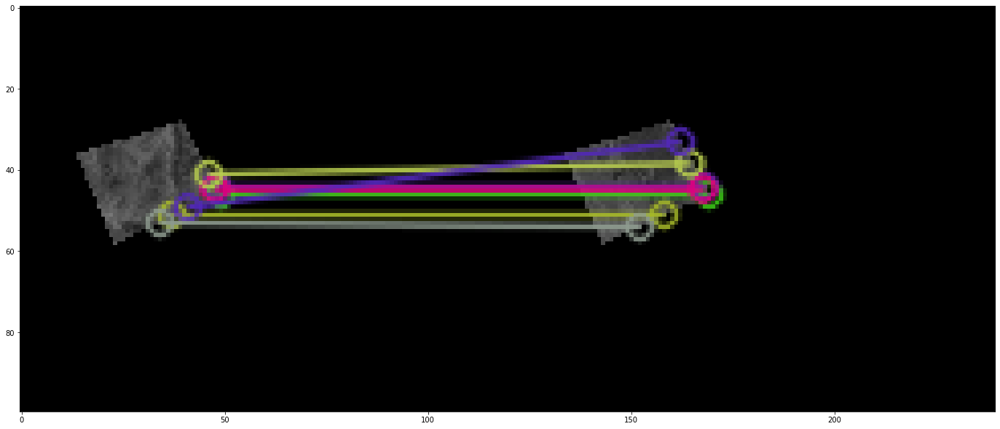

In [318]:
fig,ax = plt.subplots()
fig.set_size_inches(24,12)

orb = cv2.ORB_create()

img1 = cv2.cvtColor(np.uint8(pre_img)[650:750,150:270,:], cv2.COLOR_RGB2GRAY)
img2 = cv2.cvtColor(np.uint8(post_img)[650:750,150:270,:], cv2.COLOR_RGB2GRAY)

# find the keypoints and descriptors with SIFT
kp1, des1 = orb.detectAndCompute((img1),None)
kp2, des2 = orb.detectAndCompute((img2),None)
# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
# Match descriptors.
matches = bf.match(des1,des2)

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance) 
# Draw first 10 matches.
img3 = cv2.drawMatches(img1,kp1,img2,kp2,matches[:20],None, flags=2)

ax.imshow(img3)
plt.savefig("figures/ORB_matches_showcase.png")
plt.show()

array([[[ 49,  64,  41],
        [ 52,  68,  41],
        [ 50,  67,  38],
        ...,
        [ 70, 108,  65],
        [ 72, 109,  66],
        [ 75, 112,  68]],

       [[ 41,  55,  35],
        [ 47,  64,  38],
        [ 48,  67,  37],
        ...,
        [ 65, 102,  60],
        [ 69, 107,  63],
        [ 74, 113,  68]],

       [[ 43,  59,  36],
        [ 46,  64,  37],
        [ 49,  68,  38],
        ...,
        [ 65, 102,  60],
        [ 69, 107,  63],
        [ 74, 113,  68]],

       ...,

       [[165, 165, 155],
        [162, 162, 151],
        [162, 161, 149],
        ...,
        [ 47,  67,  42],
        [ 49,  67,  44],
        [ 42,  57,  38]],

       [[167, 168, 157],
        [163, 163, 152],
        [163, 163, 151],
        ...,
        [ 46,  67,  41],
        [ 46,  66,  41],
        [ 39,  55,  36]],

       [[165, 166, 155],
        [167, 167, 155],
        [167, 167, 154],
        ...,
        [ 46,  67,  41],
        [ 46,  66,  41],
        [ 39,  55,  36]]

In [324]:
buildings_similarity_path = './buildings_similarity.txt'
import pandas as pd

In [333]:
header = ["disaster","uid","damage","sqdiff_norm_all","sqdiff_norm_r","sqdiff_norm_g","sqdiff_norm_b"]
df = pd.read_csv(buildings_similarity_path, names=header)


,sqdiff_norm_all,sqdiff_norm_r,sqdiff_norm_g,sqdiff_norm_b
count,316114.000000,316114.000000,316114.000000,316114.000000
mean,0.153546,0.162888,0.128759,0.176993
std,0.176403,0.193441,0.157674,0.198454
min,0.000705,0.000647,0.000475,0.000648
25%,0.048381,0.049171,0.038551,0.055632
50%,0.093786,0.096051,0.076893,0.107817
75%,0.184445,0.189277,0.152387,0.213208
max,1.000000,1.000000,1.000000,1.000000


In [342]:
#Building list of disasters
disasters = df['disaster'].unique()
damages = df['damage'].unique()

In [359]:
similarity_dict = {}

sqdiff_norm_all_mean = []

for disaster in disasters:
    if disaster not in similarity_dict.keys():
        similarity_dict[disaster] = {}
        
    df_disaster = df[df['disaster'] == disaster]
    for damage in damages:
        if damage not in similarity_dict[disaster].keys():
            similarity_dict[disaster][damage] = {}
        
        df_disaster_damage = df_disaster[df_disaster['damage'] == damage]
        similarity_dict[disaster][damage]["sqdiff_norm_all"] = df_disaster_damage.describe()['sqdiff_norm_all']
        similarity_dict[disaster][damage]["sqdiff_norm_r"] = df_disaster_damage.describe()['sqdiff_norm_r']
        similarity_dict[disaster][damage]["sqdiff_norm_g"] = df_disaster_damage.describe()['sqdiff_norm_g']
        similarity_dict[disaster][damage]["sqdiff_norm_b"] = df_disaster_damage.describe()['sqdiff_norm_b']
        
        sqdiff_norm_all_mean.append(similarity_dict[disaster][damage]["sqdiff_norm_all"][1])
        

In [413]:
x = []
y = []
d_names = []
for key in similarity_dict.keys():
    x.append(key)
    y_i = []
    for d in similarity_dict[key].keys():
        if d not in d_names:
            d_names.append(d)
        y_i.append(similarity_dict[key][d]["sqdiff_norm_all"][1])
    y.append(y_i)
y = np.asarray(y)

<ipython-input-430-3aa13a972a7b>:20: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


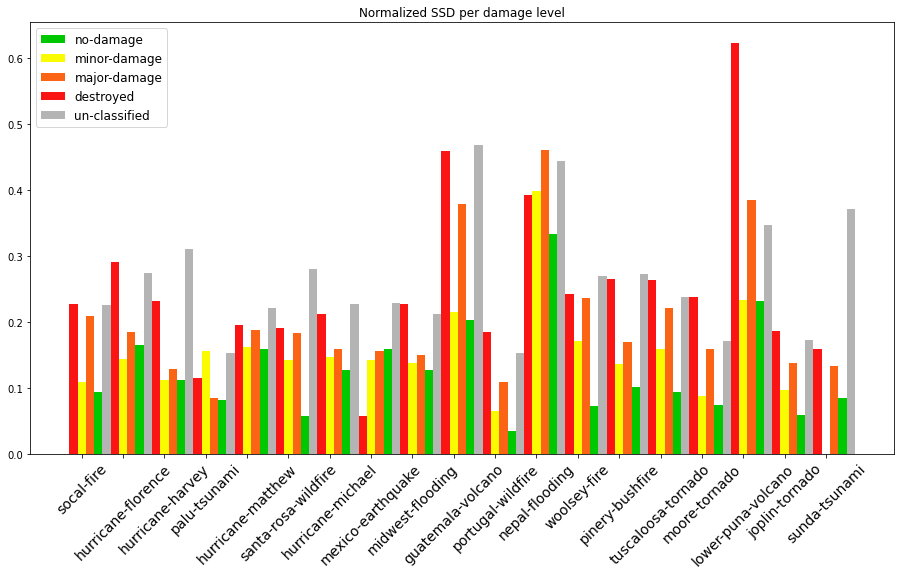

In [430]:
fig = plt.figure()
fig.set_facecolor('w')
fig.set_size_inches(12,6)
ax = fig.add_axes([0,0,1,1])
for i, disaster in enumerate(x):
    ax.bar(i +0.6, y[i,3], color = (0, 200/255, 0), width = 0.2, label='no-damage')
    ax.bar(i + 0.2, y[i,1], color = (250/255,250/255,0), width = 0.2, label='minor-damage')
    ax.bar(i + 0.4, y[i,2], color = (250/255,100/255,20/255), width = 0.2, label='major-damage')
    ax.bar(i, y[i,0], color = (250/255,20/255,20/255), width = 0.2, label='destroyed')
    ax.bar(i + 0.8, y[i,4], color = (180/255,180/255,180/255), width = 0.2, label='un-classified')
#         ax.bar(X + 0.25, y[1], color = 'g', width = 0.25)
#         ax.bar(X + 0.50, y[2], color = 'r', width = 0.25)\
plt.xticks([r + 0.2 for r in range(len(x))],
        x,rotation=45, fontsize=14)

handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), fontsize=12)
plt.title('Normalized SSD per damage level')
plt.tight_layout()
plt.savefig('Norm_SSD_all.png')
plt.show()


In [414]:
d_names

['destroyed', 'minor-damage', 'major-damage', 'no-damage', 'un-classified']

In [405]:
x

['socal-fire',
 'hurricane-florence',
 'hurricane-harvey',
 'palu-tsunami',
 'hurricane-matthew',
 'santa-rosa-wildfire',
 'hurricane-michael',
 'mexico-earthquake',
 'midwest-flooding',
 'guatemala-volcano',
 'portugal-wildfire',
 'nepal-flooding',
 'woolsey-fire',
 'pinery-bushfire',
 'tuscaloosa-tornado',
 'moore-tornado',
 'lower-puna-volcano',
 'joplin-tornado',
 'sunda-tsunami']